## Import Packages & Credentials

In [1]:
from cartoframes.auth import set_default_credentials
from cartoframes.data.observatory import Catalog, Dataset, Geography, Enrichment
from cartoframes.viz import Map, Layer, formula_widget, color_bins_style
import pandas as pd
import geopandas as gpd
import shapely
import qgrid
from IPython.display import Image
from IPython.core.display import HTML


pd.set_option('display.max_columns', None)
pd.options.display.float_format = '{:,}'.format

![Kernel & front-end diagram](FrontendKernel.png)

This notebook illustrates 
* How to access and visualize the CARTO Data Observatory v2.0.
* Create interactive maps based on your data with CARTOframes.
* How to output data to shapefiles for EDA on Spotfire

### Documentation

* [Guides](https://carto.com/developers/cartoframes/guides/Introduction/).
* [Examples](https://carto.com/developers/cartoframes/examples/).
* [Reference](https://carto.com/developers/cartoframes/reference/).

username="pg-admin"
api_key="aeb41008792d029ddd9ded1f607b745fea7390eb"
# authentication to CARTO account
set_default_credentials(username=username, api_key=api_key)


In [2]:
username="pg-admin"
api_key="aeb41008792d029ddd9ded1f607b745fea7390eb"
# authentication to CARTO account
set_default_credentials(username=username, api_key=api_key)


## Explore Data Available
- enable quick exploration of data before downloading the entire dataset
- Section 2 can be entirely skipped if data exploration on a subset of the data is not required, jump straight to Section 3

### Overview of Steps

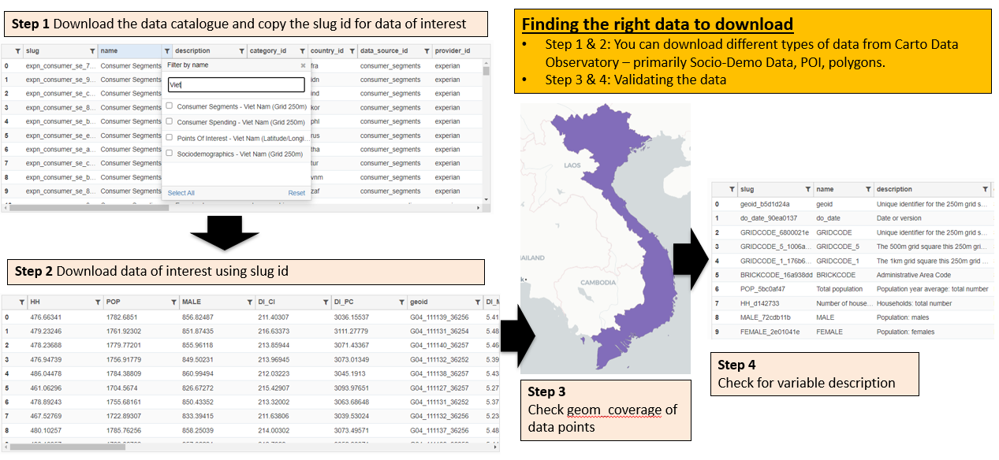

### Hands-on Exploration & Downloading Subset Data 
- qgrid is a python package that allows excel-like manipulation of dataframe
- install qgrid using pip install qgrid and run the qgrid commands below for easy filtering
- it has been commented out as the table does not load automatically when the Jupyter Notebook is loaded

#### Step 1: Select Data Catalogue and Slug id

In [10]:
# check which data is available
data_available = Catalog().subscriptions()

# list available datasets
datasets = data_available.datasets.to_dataframe()
datasets.head()
# qgrid.show_grid(datasets, grid_options={'forceFitColumns': False, 'maxVisibleRows': 10})

,slug,name,description,category_id,country_id,data_source_id,provider_id,geography_name,geography_description,temporal_aggregation,time_coverage,update_frequency,is_public_data,lang,version,category_name,provider_name,geography_id,id
0,expn_consumer_se_71cb71ed,Consumer Segments - France (Grid 250m),WorldView segments has been developed to segme...,demographics,fra,consumer_segments,experian,Grid 250m - France,Experian 250mx250m grid cells,yearly,"[2019-01-01, 2020-01-01)",yearly,False,eng,2020,Demographics,Experian,carto-do.experian.geography_fra_grid_v1,carto-do.experian.demographics_consumersegment...
1,expn_consumer_se_90d8358a,Consumer Segments - Indonesia (Grid 250m),WorldView segments has been developed to segme...,demographics,idn,consumer_segments,experian,Grid 250m - Indonesia,Experian 250mx250m grid cells,yearly,"[2019-01-01, 2020-01-01)",yearly,False,eng,2020,Demographics,Experian,carto-do.experian.geography_idn_grid_v1,carto-do.experian.demographics_consumersegment...
2,expn_consumer_se_c6fdd201,Consumer Segments - India (Grid 250m),WorldView segments has been developed to segme...,demographics,ind,consumer_segments,experian,Grid 250m - India,Experian 250mx250m grid cells,yearly,"[2019-01-01, 2020-01-01)",yearly,False,eng,2020,Demographics,Experian,carto-do.experian.geography_ind_grid_v1,carto-do.experian.demographics_consumersegment...
3,expn_consumer_se_819a7202,Consumer Segments - South Korea (Grid 250m),WorldView segments has been developed to segme...,demographics,kor,consumer_segments,experian,Grid 250m - South Korea,Experian 250mx250m grid cells,yearly,"[2020-01-01, 2021-01-01)",yearly,False,eng,2020,Demographics,Experian,carto-do.experian.geography_kor_grid_v1,carto-do.experian.demographics_consumersegment...
4,expn_consumer_se_b46ae49,Consumer Segments - Philippines (Grid 250m),WorldView segments has been developed to segme...,demographics,phl,consumer_segments,experian,Grid 250m - Philippines,Experian 250mx250m grid cells,yearly,"[2019-01-01, 2020-01-01)",yearly,False,eng,2020,Demographics,Experian,carto-do.experian.geography_phl_grid_v1,carto-do.experian.demographics_consumersegment...


In [11]:
# List available geographies 
geographies = data_available.geographies.to_dataframe()
# qgrid.show_grid(geographies, grid_options={'forceFitColumns': False, 'maxVisibleRows': 5})
geographies.head()

,slug,name,description,country_id,provider_id,geom_type,geom_coverage,update_frequency,is_public_data,lang,version,provider_name,id
0,expn_grid_806d09f,Grid 250m - United Arab Emirates,Experian 250mx250m grid cells,are,experian,POLYGON,01060000000A000000010300000001000000130000003A...,yearly,False,eng,v1,Experian,carto-do.experian.geography_are_grid_v1
1,expn_grid_33ac58d4,Grid 250m - Egypt,Experian 250mx250m grid cells,egy,experian,POLYGON,0106000000080000000103000000010000001400000012...,yearly,False,eng,v1,Experian,carto-do.experian.geography_egy_grid_v1
2,expn_grid_7cd19410,Grid 250m - France,Experian 250mx250m grid cells,fra,experian,POLYGON,0106000000150000000103000000010000003F000000C6...,yearly,False,eng,v1,Experian,carto-do.experian.geography_fra_grid_v1
3,expn_grid_93a96356,Grid 250m - Greece,Experian 250mx250m grid cells,grc,experian,POLYGON,01060000004A0000000103000000010000009A0A000026...,yearly,False,eng,v1,Experian,carto-do.experian.geography_grc_grid_v1
4,expn_grid_1a205ea8,Grid 250m - Indonesia,Experian 250mx250m grid cells,idn,experian,POLYGON,0106000000080100000103000000010000002E07000096...,yearly,False,eng,v1,Experian,carto-do.experian.geography_idn_grid_v1


#### Step 2: Explore Data of Interest Using Slug id (i.e. Vietnam Socio Demo & POI)

In [12]:
# Download Vietnam Data
here_poi_vietnam_dataset = Dataset.get('here_points_of_i_668b1e30')
here_poi_vietnam_dataset.head()
# qgrid.show_grid(here_poi_vietnam_dataset.head(), grid_options={'forceFitColumns': False, 'maxVisibleRows': 10})

,id,lat,long,geoid,do_date,chain_id,contacts,do_label,metadata,open_24h,num_house,chain_name,name_multi,time_table,category_id,last_update,postal_code,country_code,category_name,name_original,category_system,payment_methods,quality_is_open,address_original,default_language,quality_is_place,name_transliteral,external_reference,address_transliteral,admin_level2_original,admin_level3_original,admin_level4_original,admin_level5_original,alternative_geography,quality_model_version,quality_overall_score,quality_reality_score,quality_is_name_correct,admin_level2_transliteral,admin_level3_transliteral,admin_level4_transliteral,admin_level5_transliteral,quality_is_address_correct,quality_is_open_quality_level,quality_is_place_quality_level,quality_is_name_correct_quality_level,quality_is_address_correct_quality_level
0,704w6udz-0f622cdc50c444aeb94bbd0e46bcfc2e,18.6864529,108.0901017,704jx7ps-35b9c527439e0766b9f2c161a623e078,2020-04-01,None,None,Thanh Thanh Dat Building,"{""supplier"": ""BLENDED"", ""map_id"": ""APAC 20105""}",None,None,None,"{""vi"": ""Thanh Th\u00e0nh \u0110\u1ea1t Buildin...",None,300-3200-0000,2020-04-04 04:25:37.673000+00:00,None,VNM,Post Office,Thanh Thành Đạt Building,navteq-lcms,None,0.46,None,vi,0.52,Hoa Sen,"{""corepoixml"": ""1108640172""}",DUONG Nguyen Sy Sach,Quảng Nam,Vinh,Phường Hưng Bình,None,"{""type"": ""FeatureCollection"", ""features"": [{""t...",2.07,2,0.25,0.71,Quang Nam,Huyen Mang Yang,Phuong Hung Binh,None,0.47,2,3,5,3
1,704w6ufb-20df1d3ec77548c39a5475fd046aff96,18.664379966591213,108.6278777,704w774j-58dd6aee310e4f458470b51a1e07eb7c,2020-04-01,None,"{""WEBADDRESS"": ""http://cameranghean.com"", ""PHO...",Cong Ty TNHH Ky Thuat Cong Nghe Hoang Duy,"{""supplier"": ""BLENDED"", ""map_id"": ""APAC 20105""}",None,None,None,"{""vi"": ""C\u00f4ng Ty TNHH K\u1ef9 Thu\u1eadt C...",None,300-3200-0000,2020-04-04 10:30:41.457000+00:00,None,VNM,Seafood,Công Ty TNHH Kỹ Thuật Công Nghệ Hoàng Duy,navteq-lcms,None,0.46,Quốc Lộ 14G,vi,0.51,Hoa Sen,None,DUONG Phong Dinh Cang,Quảng Nam,Vinh,Phường Bến Thủy,None,"{""type"": ""FeatureCollection"", ""features"": [{""t...",2.07,2,0.25,1.0,Quang Nam,Cam Ranh,Phuong Ben Thuy,None,0.47,2,3,5,3
2,704w6ufb-0a76859f26cf41cb860625c045509a2d,18.68441,108.47362,704jx7ps-5cfa03ea7c14043731a9baffa66b10c0,2020-04-01,1083,None,Cienco 4 Tower,"{""supplier"": ""BLENDED"", ""map_id"": ""APAC 20105""}",None,None,None,"{""vi"": ""Cienco 4 Tower"", ""vi-Latn"": ""Cienco 4 ...",None,100-1000-0000,2020-04-04 12:59:14.599000+00:00,None,VNM,Seafood,Cienco 4 Tower,navteq-lcms,None,0.52,Quốc Lộ 14G,vi,0.52,Trung Tam Cho 721,"{""corepoixml"": ""1108638176""}",DUONG Le Loi,Quảng Nam,Vinh,Phường Lê Lợi,None,None,2.07,2,0.25,0.71,Quang Nam,Cam Ranh,Phuong Le Loi,None,0.58,2,3,5,3
3,704w6ufb-13da98b612574a5cae97271488baabd6,10.76854,108.42285,704jx7ps-89b1ed482edc0a2d72675bf4fc9854b6,2020-04-01,None,None,Toa Nha Viet Thang,"{""supplier"": ""BLENDED"", ""map_id"": ""APAC 20105""}",None,None,None,"{""vi"": ""T\u00f2a Nh\u00e0 Vi\u1ec7t Th\u1eafng...",None,100-1000-0000,2020-04-04 01:16:57.943000+00:00,None,VNM,Post Office,Tòa Nhà Việt Thắng,navteq-lcms,None,0.48,Quốc Lộ 14G,vi,0.52,Cong Ty Ca Phe 719,"{""corepoixml"": ""1108662684""}",DUONG Vo Van Kiet,Quảng Nam,Quận 1,Phường Nguyễn Thái Bình,None,"{""type"": ""FeatureCollection"", ""features"": [{""t...",2.07,2,0.25,0.71,Quang Nam,Huyen Mang Yang,Phuong Nguyen Thai Binh,None,0.48,2,3,5,3
4,704w6kvs-304e741a70184292a7f8efdbc9360667,10.77473,106.9221227,704jx7ps-34809745755d09b41d73fc0b4a295590,2020-04-01,None,None,Toa Nha Minh Hoa Phu,"{""supplier"": ""BLENDED"", ""map_id"": ""APAC 20105""}",None,22,None,"{""vi"": ""T\u00f2a Nh\u00e0 Minh H\u00f2a Ph\u00...",None,300-3000-0023,2020-04-04 08:52:54.025000+00:00,None,VNM,Petrol-Gasoline Station,Tòa Nhà Minh Hòa Phú,navteq-lcms,None,0.47,None,vi,0.52,Cong Ty TNHH San Xuat Thuong Mai Thien Long Lo...,"{""corepoixml"": ""1108662627""}",DUONG Le Loi,Gia Lai,Quận 1,Phường Bến Nghé,None,"{""type"": ""FeatureCo

In [13]:
experian_sociodemogr_vietnam_dataset = Dataset.get('expn_sociodemogr_8ddb0f1e')
# qgrid.show_grid(experian_sociodemogr_vietnam_dataset.head(), grid_options={'forceFitColumns': False, 'maxVisibleRows': 10})
experian_sociodemogr_vietnam_dataset.head()

,HH,POP,MALE,DI_CI,DI_PC,geoid,DI_MIO,FEMALE,do_date,CTRYCODE,GRIDCODE,AGE_F0014,AGE_F1529,AGE_F3044,AGE_F4559,AGE_F60PL,AGE_M0014,AGE_M1529,AGE_M3044,AGE_M4559,AGE_M60PL,AGE_T0014,AGE_T1529,AGE_T3044,AGE_T4559,AGE_T60PL,BRICKCODE
0,476.663414,"1,782.685101",856.824873,211.403068,"3,036.155367",G04_111139_36256,5.412509,925.860227,2020-01-01,VN,G04_111139_36256,174.70866,243.325487,199.45584,190.000695,118.369545,183.571945,207.202,181.049164,183.343526,101.658238,358.280605,450.527487,380.505004,373.344221,220.027783,01001
1,479.232464,"1,761.92302",851.874347,216.633733,"3,111.277787",G04_111131_36254,5.481832,910.048673,2020-01-01,VN,G04_111131_36254,171.492463,236.85162,197.924415,188.09113,115.689044,182.607188,207.808483,181.284417,181.991466,98.182793,354.099652,444.660103,379.208832,370.082596,213.871838,01001
2,478.236885,"1,779.77201",855.961175,213.859445,"3,071.433674",G04_111140_36257,5.466452,923.810835,2020-01-01,VN,G04_111140_36257,173.097655,242.139812,200.659068,190.111048,117.803252,180.428727,205.476504,184.155962,184.478751,101.42123,353.526382,447.616316,384.81503,374.589799,219.224483,01001
3,476.947394,"1,756.917788",849.502314,213.969446,"3,073.013492",G04_111132_36252,5.399032,907.415474,2020-01-01,VN,G04_111132_36252,170.481138,237.543475,197.099872,186.018998,116.271992,182.41176,209.02123,178.716799,181.17935,98.173175,352.892898,446.564705,375.816671,367.198348,214.445167,01001
4,486.044776,"1,784.388091",860.994942,212.032227,"3,045.191304",G04_111138_36257,5.433803,923.393149,2020-01-01,VN,G04_111138_36257,175.226678,241.225995,202.111912,187.280022,117.548542,184.245593,211.565109,180.323365,183.497072,101.363802,359.472271,452.791105,382.435277,370.777094,218.912344,01001
5,461.062963,"1,704.567396",826.672717,215.42907,"3,093.976515",G04_111127_36257,5.273891,877.894678,2020-01-01,VN,G04_111127_36257,165.860272,223.894576,193.695238,183.178291,111.266302,179.732479,201.84807,173.273684,175.957734,95.86075,345.592751,425.742645,366.968922,359.136026,207.127052,01001
6,478.892425,"1,755.681611",850.433515,213.32002,"3,063.686482",G04_111131_36252,5.378858,905.248096,2020-01-01,VN,G04_111131_36252,171.250321,234.897899,197.347082,186.15114,115.601655,183.060711,209.128476,178.398838,181.525738,98.319753,354.311032,444.026375,375.745919,367.676878,213.921407,01001
7,467.527688,"1,722.893069",833.394149,211.638056,"3,039.530245",G04_111132_36256,5.236786,889.498921,2020-01-01,VN,G04_111132_36256,168.020309,231.993323,193.679681,184.233499,111.572109,179.015082,204.581091,174.343764,178.026696,97.427516,347.035391,436.574414,368.023444,362.260195,208.999625,01001
8,480.10257,"1,785.762563",858.250392,214.003022,"3,073.495714",G04_111137_36256,5.488534,927.512171,2020-01-01,VN,G04_111137_36256,175.336078,241.898669,202.217906,189.550676,118.508842,183.59781,209.153402,180.87277,183.336941,101.28947,358.933888,451.052071,383.090676,372.887617,219.798312,01001
9,480.10257,"1,782.867823",857.066806,212.798796,"3,056.200712",G04_111138_36256,5.448802,925.801017,2020-01-01,VN,G04_111138_36256,174.653699,240.869895,202.217906,189.550676,118.508842,183.221305,208.34632,180.87277,183.336941,101.28947,357.875005,449.216215,383.090676,372.887617,219.798312,01001


#### Step 3: Check Geom Coverage

In [7]:
experian_sociodemogr_vietnam_dataset.geom_coverage()

#### Step 4:Check for Variable Description

In [15]:
variables_df = experian_sociodemogr_vietnam_dataset.variables.to_dataframe()
variables_df.head()
# qgrid.show_grid(variables_df, grid_options={'forceFitColumns': False, 'maxVisibleRows': 10})

,slug,name,description,db_type,agg_method,column_name,variable_group_id,dataset_id,id
0,geoid_b5d1d24a,geoid,Unique identifier for the 250m grid square,STRING,None,geoid,None,carto-do.experian.demographics_sociodemographi...,carto-do.experian.demographics_sociodemographi...
1,do_date_90ea0137,do_date,Date or version,STRING,None,do_date,None,carto-do.experian.demographics_sociodemographi...,carto-do.experian.demographics_sociodemographi...
2,GRIDCODE_6800021e,GRIDCODE,Unique identifier for the 250m grid square,STRING,None,GRIDCODE,None,carto-do.experian.demographics_sociodemographi...,carto-do.experian.demographics_sociodemographi...
3,GRIDCODE_5_1006a1b4,GRIDCODE_5,The 500m grid square this 250m grid shares,STRING,None,GRIDCODE_5,None,carto-do.experian.demographics_sociodemographi...,carto-do.experian.demographics_sociodemographi...
4,GRIDCODE_1_176b65ad,GRIDCODE_1,The 1km grid square this 250m grid shares,STRING,None,GRIDCODE_1,None,carto-do.experian.demographics_sociodemographi...,carto-do.experian.demographics_sociodemographi...


## Download Entire Dataset of Interest
- Download entire dataset for market of interest using the following
    - Bounding Box Approach: Part of a market
    - Entire Country Approach: Entire market (Alert: Data download will be slow and huge)
    - For POIs, can choose to download all POIs or certain categories of POI

### Overview of Steps

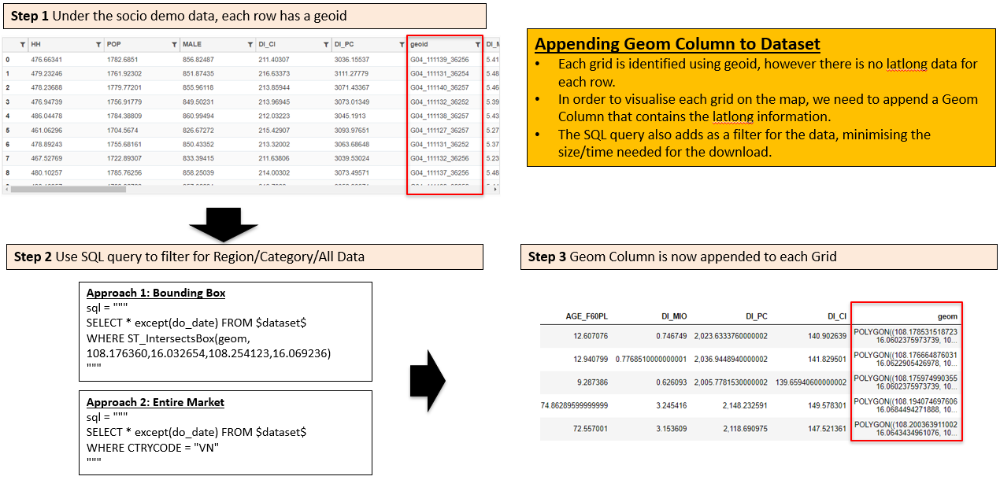

### Download Socio Demo (Bounding Box/Entire Market)

In [20]:
# Choose one of the following approach

################ Bounding Box ################
# define sql query to get data from dataset. Data must be inside the bounding box of Vietname
# BBox is "108.076381,15.991447,108.387432,16.137765", we got it using an external tool named http://bboxfinder.com/
sql = """
SELECT * except(do_date) FROM $dataset$ 
WHERE ST_IntersectsBox(geom, 108.176360,16.032654,108.254123,16.069236)
"""

################ Entire Market ################
# Instead of using Bounding Box, we can also specify the Country and download the socio-demo of the entire country
# sql = """
# SELECT * except(do_date) FROM $dataset$ 
# WHERE CTRYCODE = "VN"
# """

experian_sociodemogr_vietnam_dataset_df = experian_sociodemogr_vietnam_dataset.to_dataframe(sql_query=sql)
experian_sociodemogr_vietnam_dataset_df.head()
# qgrid.show_grid(experian_sociodemogr_vietnam_dataset_df, grid_options={'forceFitColumns': False, 'maxVisibleRows': 10})

,geoid,CTRYCODE,GRIDCODE,BRICKCODE,POP,HH,MALE,FEMALE,AGE_T0014,AGE_M0014,AGE_F0014,AGE_T1529,AGE_M1529,AGE_F1529,AGE_T3044,AGE_M3044,AGE_F3044,AGE_T4559,AGE_M4559,AGE_F4559,AGE_T60PL,AGE_M60PL,AGE_F60PL,DI_MIO,DI_PC,DI_CI,geom
0,G04_112793_33844,VN,G04_112793_33844,48490,369.014217,96.390085,183.089382,185.924834,79.57407099999999,41.686627,37.887444,143.933997,70.448947,73.48505,81.437727,41.562994,39.874733,43.198498,21.127967,22.070531,20.869923,8.262847,12.607076,0.746749,"2,023.6333760000002",140.902639,"POLYGON((108.178531518723 16.0602375973739, 10..."
1,G04_112792_33845,VN,G04_112792_33845,48490,381.380446,100.027865,189.24291100000002,192.13753400000002,81.492432,42.601109,38.891323,150.103138,73.589191,76.513947,83.764179,42.691801,41.072377,44.534659000000005,21.815572,22.719088,21.486038,8.54524,12.940799,0.7768510000000001,"2,036.9448940000002",141.829501,"POLYGON((108.176664876031 16.0622905426978, 10..."
2,G04_112792_33844,VN,G04_112792_33844,48490,312.144487,82.788625,155.438195,156.706292,65.408386,34.246297,31.162089,132.350657,65.017285,67.333372,66.119051,33.982291,32.136759999999995,32.900541,16.113858,16.786684,15.365851000000001,6.0784650000000005,9.287386,0.626093,"2,005.7781530000002",139.65940600000002,"POLYGON((108.175974990355 16.0602375973739, 10..."
3,G04_112798_33848,VN,G04_112798_33848,48491,"1,510.737885",375.49771699999997,744.134945,766.602941,336.885881,177.0396,159.846281,450.72703600000006,218.80237999999997,231.92465499999997,365.866565,185.110947,180.755618,233.659821,114.44633200000001,119.21349,123.59858200000001,48.735686,74.86289599999999,3.245416,"2,148.232591",149.578301,"POLYGON((108.194074697606 16.0684494271888, 10..."
4,G04_112801_33846,VN,G04_112801_33846,48491,"1,488.470316",365.394275,730.084598,758.385718,330.975475,174.113194,156.862282,450.109367,216.355778,233.753589,359.704753,180.56999,179.134763,227.789373,111.71128999999999,116.078083,119.891348,47.334346999999994,72.557001,3.153609,"2,118.690975",147.521361,"POLYGON((108.200363911002 16.0643434961076, 10..."


### Download POIs (Entire Market & Specific Category)
- Get and display all POI from the selected category
- All category IDs are on the following webpage https://developer.here.com/documentation/places/dev_guide/topics/place_categories/places-category-system.html
- E.g. Convenience store is 600-6000-0061

In [19]:
# Choose one out of the three examples
################### Example 1 ##############################
#You can also directly search by category name with a condition WHERE category_name LIKE 'Convenience' 
# sql = """
# SELECT * except(do_date, do_label) FROM $dataset$ WHERE category_id LIKE '600-6000%'
# """

################### Example 2 ##############################
# Entire Country and all Categories
# sql = """
# SELECT * except(do_date, do_label) FROM $dataset$
# """

################### Example 3 ##############################
# Part of Country and Category = 600, i.e. Shopping
# BBox is "108.076381,15.991447,108.387432,16.137765", we got it using an external tool named http://bboxfinder.com/
sql = """
SELECT * except(do_date, do_label) FROM $dataset$
WHERE ST_IntersectsBox(geom, 108.176360,16.032654,108.254123,16.069236)
AND category_id LIKE '600%'
"""

try:
    here_poi_vietnam_dataset_df =  here_poi_vietnam_dataset.to_dataframe(sql_query=sql)
except Exception as inst:
    print(f"Some error ocurred with {here_poi_vietnam_dataset}")
    print(f"--{type(inst)}")
    print(f"---{inst}")

here_poi_vietnam_dataset_df.head()
# qgrid.show_grid(here_poi_vietnam_dataset_df, grid_options={'forceFitColumns': False, 'maxVisibleRows': 10})

,geoid,lat,long,id,last_update,default_language,num_house,address_original,address_transliteral,admin_level2_original,admin_level2_transliteral,admin_level3_original,admin_level3_transliteral,admin_level4_original,admin_level4_transliteral,admin_level5_original,admin_level5_transliteral,postal_code,country_code,alternative_geography,name_original,name_transliteral,name_multi,category_system,category_id,category_name,contacts,chain_id,chain_name,open_24h,time_table,payment_methods,external_reference,quality_is_name_correct,quality_is_name_correct_quality_level,quality_is_address_correct,quality_is_address_correct_quality_level,quality_is_place,quality_is_place_quality_level,quality_is_open,quality_is_open_quality_level,quality_reality_score,quality_model_version,quality_overall_score,metadata,geom
0,704w6ugm-d5cd8794dfb64ffda1e04dcba7cb78be,16.062715599999997,108.1810121,704w6ugm-d5cd8794dfb64ffda1e04dcba7cb78be,2020-04-12 20:11:31.599000+00:00,vi,183,Đường Cù Chính Lan,Duong Cu Chinh Lan,Đà Nẵng,Da Nang,Quận Thanh Khê,Quan Thanh Khe,Phường An Khê,Phuong An Khe,nan,nan,nan,VNM,"{""type"": ""FeatureCollection"", ""features"": [{""t...",Cửa Hàng Nhôm Kính Anh Dồ 2,Cua Hang Nhom Kinh Anh Do 2,"{""vi"": ""C\u1eeda H\u00e0ng Nh\u00f4m K\u00ednh...",navteq-lcms,600-6600-0080,Furniture Store,"{""PHONE"": null}",nan,NaN,NaN,NaN,NaN,NaN,0.71,5,0.66,4,0.4,2,0.29,2,0.12,2.07,2,"{""supplier"": ""BLENDED"", ""map_id"": ""APAC 20105""}",POINT(108.1810121 16.0627156)
1,704w6ugm-e03bf291980d45aa8b7edc74301bc236,16.0572609,108.18496280000001,704w6ugm-e03bf291980d45aa8b7edc74301bc236,2020-04-04 07:31:05.029000+00:00,vi,36,Đường Nguyễn Giản Thanh,Duong Nguyen Gian Thanh,Đà Nẵng,Da Nang,Quận Thanh Khê,Quan Thanh Khe,Phường An Khê,Phuong An Khe,nan,nan,nan,VNM,"{""type"": ""FeatureCollection"", ""features"": [{""t...",Tai Nghe Đẹp & Độc - Mstore,Tai Nghe Dep & Doc - Mstore,"{""vi"": ""Tai Nghe \u0110\u1eb9p & \u0110\u1ed9c...",navteq-lcms,600-6600-0085,Major Appliance,"{""PHONE"": ""+84387295160"", ""WEBADDRESS"": ""http:...",nan,NaN,NaN,NaN,NaN,NaN,0.7,5,0.64,4,0.4,2,0.35,2,0.14,2.07,2,"{""supplier"": ""BLENDED"", ""map_id"": ""APAC 20105""}",POINT(108.1849628 16.0572609)
2,704w6ugj-3767370c014043faab95107bad9cd13e,16.0370775,108.18730479999999,704w6ugj-3767370c014043faab95107bad9cd13e,2020-04-12 21:20:22.047000+00:00,vi,NaN,Đường Trường Chinh,Duong Truong Chinh,Đà Nẵng,Da Nang,Quận Thanh Khê,Quan Thanh Khe,Phường An Khê,Phuong An Khe,nan,nan,nan,VNM,"{""type"": ""FeatureCollection"", ""features"": [{""t...",Đồng Tiến Bakery - Trường Chinh,Dong Tien Bakery - Truong Chinh,"{""vi"": ""\u0110\u1ed3ng Ti\u1ebfn Bakery - Tr\u...",navteq-lcms,600-6300-0244,Bakery and Baked Goods Store,"{""PHONE"": null}",nan,NaN,NaN,NaN,NaN,NaN,0.71,5,0.45,3,0.4,2,0.28,2,0.11,2.07,2,"{""supplier"": ""BLENDED"", ""map_id"": ""APAC 20105""}",POINT(108.1873048 16.0370775)
3,704w6ugm-eb12bfe2a2024a1eb182ac3cf480c3de,16.043399800000003,108.18848440000001,704w6ugm-eb12bfe2a2024a1eb182ac3cf480c3de,2020-04-04 10:30:33.103000+00:00,vi,NaN,Đường Phạm Ngọc Mậu,Duong Pham Ngoc Mau,Đà Nẵng,Da Nang,Quận Thanh Khê,Quan Thanh Khe,Phường An Khê,Phuong An Khe,nan,nan,nan,VNM,"{""type"": ""FeatureCollection"", ""features"": [{""t...",Tạp Hóa Mạnh Nhị,Tap Hoa Manh Nhi,"{""vi"": ""T\u1ea1p H\u00f3a M\u1ea1nh Nh\u1ecb"",...",navteq-lcms,600-6000-0061,Convenience Store,NaN,nan,NaN,NaN,NaN,NaN,NaN,0.71,5,0.44,3,0.39,2,0.27,2,0.11,2.07,2,"{""supplier"": ""BLENDED"", ""map_id"": ""APAC 20105""}",POINT(108.1884844 16.0433998)
4,704w6ugj-25943f6358b446e2a962e6e7891fe82d,16.038918099999997,108.18669609999999,704w6ugj-25943f6358b446e2a962e6e7891fe82d,2020-04-12 20:11:42.206000+00:00,vi,351,Đường Trường Chinh,Duong Truong Chinh,Đà Nẵng,Da Nang,Quận Thanh Khê,Quan Thanh Khe,Phường An Khê,Phuong An Khe,nan,nan,nan,VNM,"{""type"": ""FeatureCollection"", ""features"": [{""t...",Cửa Hàng Tạp Hóa Trần Thanh Bình,Cua Hang Tap Hoa Tran Thanh Binh,"{""vi"": ""C\u1eeda H\u00e0ng T\u1ea1p H\u00f3a T...",navteq-

## Visualisation of Socio Demo & POIs
- The Map module offers much flexibility visualising the data, with a steeper learning curve.
- The tutorial covers 3 ways to visualise the data, with increasing level of difficulty.
- For those who are familiar with Spotfire's interface, you can choose to output the data into shapefiles for further EDA (**Refer to Section 5**) on your Spotfire.
- More details can be found at https://carto.com/developers/cartoframes/guides/Visualization/

### Overview of Visualisation

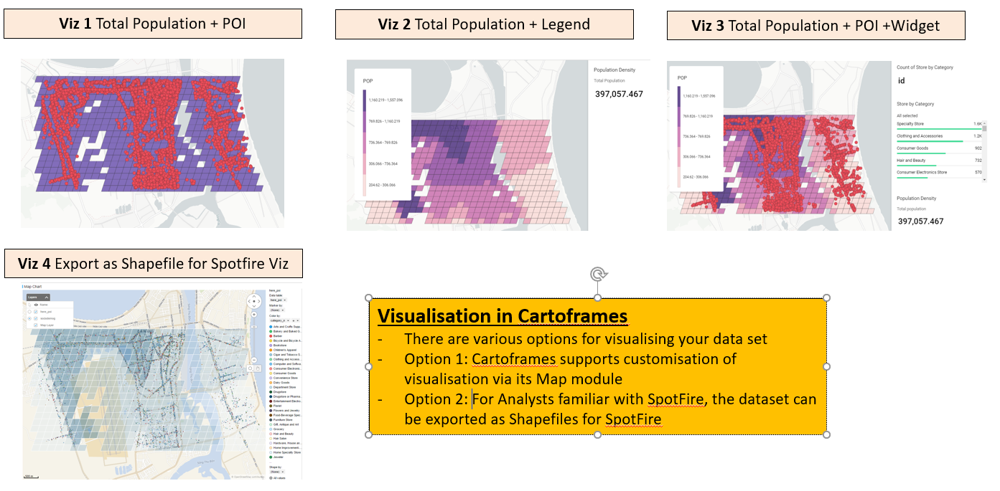

### Simple Visualisation of Data (No Widget, 2 layers)

In [40]:
Map([
    Layer(experian_sociodemogr_vietnam_dataset_df, # dataframe that contains the data in the bounding box of Vietnam
    geom_col='geom'), 
    Layer(here_poi_vietnam_dataset_df,
    geom_col='geom')
])

### Using Widget with 1 Layer within Map

In [37]:
# create map to see HERE POIs data
# More info about creating maps in https://carto.com/developers/cartoframes/reference/#heading-Viz

Layer(
    experian_sociodemogr_vietnam_dataset_df, # dataframe that contains the data in the bounding box of Vietnam
    geom_col='geom', # we indicate the column that contains the geometries
    style= color_bins_style('POP'),
    widgets=[
        # we set a category widget to explore our data in an interactive way
        formula_widget(
            'POP', # name of the field that we want to see in the category widget
            operation='SUM',
            title='Population Density', 
            description='Total Population'
        )
    ]
)

### Using Widget with Multiple Layers within Map

In [38]:
# create map to see HERE POIs data
# More info about creating maps in https://carto.com/developers/cartoframes/reference/#heading-Viz
from cartoframes.viz import Map, Layer, formula_widget, color_bins_style,category_widget, popup_element
Map([
    Layer(
    experian_sociodemogr_vietnam_dataset_df, # dataframe that contains the data in the bounding box of Vietnam
    geom_col='geom', # we indicate the column that contains the geometries
    style= color_bins_style('POP'),
    widgets=[
        # we set a category widget to explore our data in an interactive way
        formula_widget(
            'POP', # name of the field that we want to see in the category widget
            operation='SUM',
            title='Population Density', 
            description='Total population')  
    ]),
    Layer(
    here_poi_vietnam_dataset_df,
    geom_col='geom', # we indicate the column that contains the geometries
    widgets=[
        formula_widget(
            'id',
            'count',
            title='Count of Store by Category'
        ),
        category_widget(
            'category_name',
            title='Store by Category'
        )
    ],
    popup_hover=[
        popup_element('name_original',title='Name of the store'),
        popup_element('address_original',title='Address of the store')
    ],
   encode_data=False)
]
)

## Output Data to Shapefile for Spotfire
- Converts Pandas DataFrame to GeoPandas DataFrame (i.e. geom column is recognised as geometry type)
- Then output to Shapefile for Spotfire or other visualisation tools

In [41]:
# Convert POI into GeoPandas DF
here_poi_vietnam_dataset_df['geom'] = here_poi_vietnam_dataset_df['geom'].apply(shapely.wkt.loads)
here_poi_gdf = gpd.GeoDataFrame(here_poi_vietnam_dataset_df, crs="EPSG:4326", geometry='geom')

In [42]:
# Output Socio Demo into GeoPandas DF
experian_sociodemogr_vietnam_dataset_df['geom'] = experian_sociodemogr_vietnam_dataset_df['geom'].apply(shapely.wkt.loads)
sociodemog_gdf = gpd.GeoDataFrame(experian_sociodemogr_vietnam_dataset_df, crs="EPSG:4326", geometry='geom')

In [ ]:
# export to shapefile
here_poi_gdf.to_file('here_poi.shp', encoding='utf-8')
sociodemog_gdf.to_file('sociodemog.shp', encoding='utf-8')